# MultiSplitDecisionTreeCalssifier

## Навигация

1. [Эксперимент с построением дерева с одним признаком возрастом](#Эксперимент-с-построением-дерева-с-одним-признаком-возрастом)
   - [Моё дерево](#Моё-дерево)
   - [Дерево из sklearn](#Дерево-из-sklearn)
2. [Переобученная модель дерева решений](#Переобученная-модель-дерева-решений)
3. [Обобщающая модель дерева решений](#Обобщающая-модель-дерева-решений)
4. [Feature importances](#Feature-importances)

In [1]:
import os
import sys
sys.path.append('..')
import subprocess

from IPython import display
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd

from sklearn.metrics import classification_report
from sklearn.model_selection import GridSearchCV, StratifiedShuffleSplit
from sklearn.model_selection import train_test_split
from sklearn.tree import DecisionTreeClassifier
from sklearn.tree import export_graphviz

from multi_split_decision_tree import MultiSplitDecisionTreeClassifier
import src

In [2]:
pd.set_option('display.max_columns', None)

In [3]:
data = pd.read_csv(os.path.join('..', 'data', 'interim', 'encoded.csv'), index_col=0)

X = data.drop(columns=src.constants.TARGET)
y = data[src.constants.TARGET]

## Эксперимент с построением дерева с одним признаком возрастом

[Навигация](#Навигация)

### Моё дерево

[Навигация](#Навигация)

In [4]:
notna_mask = X[src.constants.QUESTION_2].notna()
X_age = pd.DataFrame(X.loc[notna_mask, src.constants.QUESTION_2])
y_age = y[notna_mask]

In [5]:
my_tree = MultiSplitDecisionTreeClassifier(
    numerical_feature_names=[src.constants.QUESTION_2],
)
my_tree.fit(X_age, y_age)

filename = os.path.join('..', 'reports', 'figures', 'MultiSplitDecisionTreeClassifier one numerical feature.gv')
my_tree.render(
    rounded=True,
    show_impurity=True,
    show_num_samples=True,
    show_distribution=True,
    show_label=True,
    filename=filename,
    format='png',
)
display.Image(f'{filename}.png')

### Дерево из sklearn

[Навигация](#Навигация)

In [6]:
sklearn_tree = DecisionTreeClassifier()
sklearn_tree.fit(X_age, y_age)

DecisionTreeClassifier()

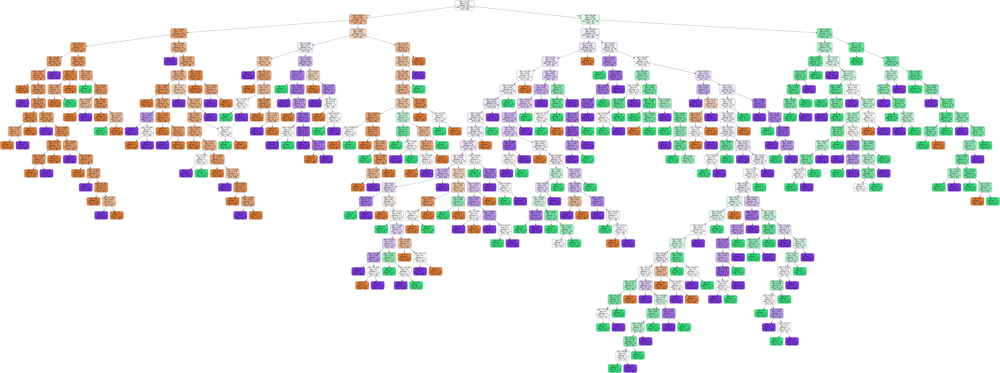

In [7]:
filename_gv = os.path.join('..', 'reports', 'figures', 'sklearn DecisionTreeClassifier one numerical feature.gv')
filename_png = os.path.join('..', 'reports', 'figures', 'sklearn DecisionTreeClassifier one numerical feature.png')
export_graphviz(
    sklearn_tree,
    out_file=filename_gv,
    class_names=True,
    filled=True,
    rounded=True,
)
# конвертируем из .gv в .png через командую строку
subprocess.call(['dot', '-Tpng', f'{filename_gv}', '-o', f'{filename_png}'])
display.Image(filename_png)

## Переобученная модель дерева решений

[Навигация](#Навигация)

In [8]:
overfitted_tree = MultiSplitDecisionTreeClassifier(
    numerical_feature_names=src.constants.NUMERICAL_FEATURES+list(src.constants.BINARY_FEATURES.keys()),
    categorical_feature_names=list(src.constants.CATEGORICAL_FEATURES.keys()),
    rank_feature_names=src.constants.RANK_FEATURES,
    hierarchy={
        src.constants.QUESTION_3: [src.constants.QUESTION_4, src.constants.QUESTION_20],
        src.constants.QUESTION_6: src.constants.QUESTION_7,
        src.constants.QUESTION_8: src.constants.QUESTION_9,
        src.constants.QUESTION_10: src.constants.QUESTION_11,
        src.constants.QUESTION_23: src.constants.QUESTION_24,
        src.constants.QUESTION_27: src.constants.QUESTION_26,
    },
)
overfitted_tree.fit(X, y)

filename = os.path.join('..', 'reports', 'figures', 'MultiSplitDecisionTreeClassifier overfitted.gv')
overfitted_tree.render(
    rounded=True,
    show_impurity=True,
    show_num_samples=True,
    show_distribution=True,
    show_label=True,
    filename=filename,
    format='png',
)
display.Image(f'{filename}.png')

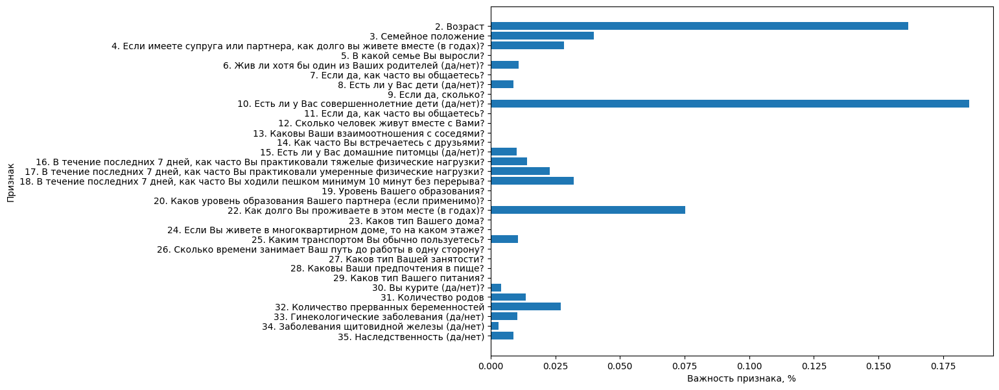

In [9]:
features = list(overfitted_tree.feature_importances.keys())
importances = overfitted_tree.feature_importances.values()

fig, ax = plt.subplots(figsize=(10, 7))

ax.barh(list(reversed(features)), list(reversed(importances)), align='center')
ax.set(xlabel='Важность признака, %', ylabel='Признак')

plt.savefig(os.path.join('..', 'reports', 'figures', 'MultiSplitDecisionTreeClassifier overfitted feature_importances.png'))
plt.show()

## Обобщающая модель дерева решений

[Навигация](#Навигация)

In [10]:
X_train, X_test, y_train, y_test = train_test_split(
    X, y, stratify=y, random_state=src.constants.RANDOM_STATE)

Кросс-валидации гиперпараметров.

In [11]:
search = GridSearchCV(
    estimator=MultiSplitDecisionTreeClassifier(
        numerical_feature_names=src.constants.NUMERICAL_FEATURES+list(src.constants.BINARY_FEATURES.keys()),
        categorical_feature_names=list(src.constants.CATEGORICAL_FEATURES.keys()),
        rank_feature_names=src.constants.RANK_FEATURES,
        hierarchy={
            src.constants.QUESTION_3: [src.constants.QUESTION_4, src.constants.QUESTION_20],
            src.constants.QUESTION_6: src.constants.QUESTION_7,
            src.constants.QUESTION_8: src.constants.QUESTION_9,
            src.constants.QUESTION_10: src.constants.QUESTION_11,
            src.constants.QUESTION_23: src.constants.QUESTION_24,
            src.constants.QUESTION_27: src.constants.QUESTION_26,
        },
    ),
    param_grid=[
        {
            'min_samples_split': [2],
            'min_samples_leaf': [1],
        },
        {
            'min_samples_split': [4],
            'min_samples_leaf': [1, 2],
        },
        {
            'min_samples_split': [8],
            'min_samples_leaf': [1, 2, 4],
        },
        {
            'min_samples_split': [16],
            'min_samples_leaf': [1, 2, 4, 8],
        },
        {
            'min_samples_split': [32],
            'min_samples_leaf': [1, 2, 4, 8, 16],
        },
        {
            'min_samples_split': [64],
            'min_samples_leaf': [1, 2, 4, 8, 16, 32],
        },
        {
            'min_samples_split': [128],
            'min_samples_leaf': [1, 2, 4, 8, 16, 32, 64],
        },
        {
            'min_samples_split': [256],
            'min_samples_leaf': [1, 2, 4, 8, 16, 32, 64, 128],
        },
        {
            'min_samples_split': [512],
            'min_samples_leaf': [1, 2, 4, 8, 16, 32, 64, 128, 256],
        },
    ],
    cv=StratifiedShuffleSplit(n_splits=5, random_state=src.constants.RANDOM_STATE),
)

search.fit(X_train, y_train)

GridSearchCV(cv=StratifiedShuffleSplit(n_splits=5, random_state=42, test_size=None,
            train_size=None),
             estimator=MultiSplitDecisionTreeClassifier(numerical_feature_names=['2. Возраст', '4. Если имеете супруга или партнера, как долго вы живете вместе (в годах)?', '22. Как долго Вы проживаете в этом месте (в годах)?', '24. Если Вы живете в многоквартирном доме, то на каком этаже?', '6. Жив ли...
                          'min_samples_split': [16]},
                         {'min_samples_leaf': [1, 2, 4, 8, 16],
                          'min_samples_split': [32]},
                         {'min_samples_leaf': [1, 2, 4, 8, 16, 32],
                          'min_samples_split': [64]},
                         {'min_samples_leaf': [1, 2, 4, 8, 16, 32, 64],
                          'min_samples_split': [128]},
                         {'min_samples_leaf': [1, 2, 4, 8, 16, 32, 64, 128],
                          'min_samples_split': [256]},
                         {'min_samples_leaf': [1, 2, 4, 8, 16, 32, 64, 128,
                                               256],
                          'min_samples_split': [512]}])

In [12]:
print('Лучшие гиперпараметры:')
for hyperparam, value in search.best_params_.items():
    print(f'* {hyperparam}: {value}')
print(f'Лучший mean Accuracy: {search.best_score_}')

Лучшие гиперпараметры:
* min_samples_leaf: 4
* min_samples_split: 32
Лучший mean Accuracy: 0.5955555555555556


In [13]:
generalizing_tree = search.best_estimator_
y_pred = generalizing_tree.predict(X_test)
print(classification_report(y_test, y_pred, zero_division=0))

                           precision    recall  f1-score   support

доброкачественная опухоль       0.61      0.50      0.55        50
  злокачественная опухоль       0.49      0.76      0.60        50
                    норма       0.23      0.14      0.18        49

                 accuracy                           0.47       149
                macro avg       0.44      0.47      0.44       149
             weighted avg       0.44      0.47      0.44       149



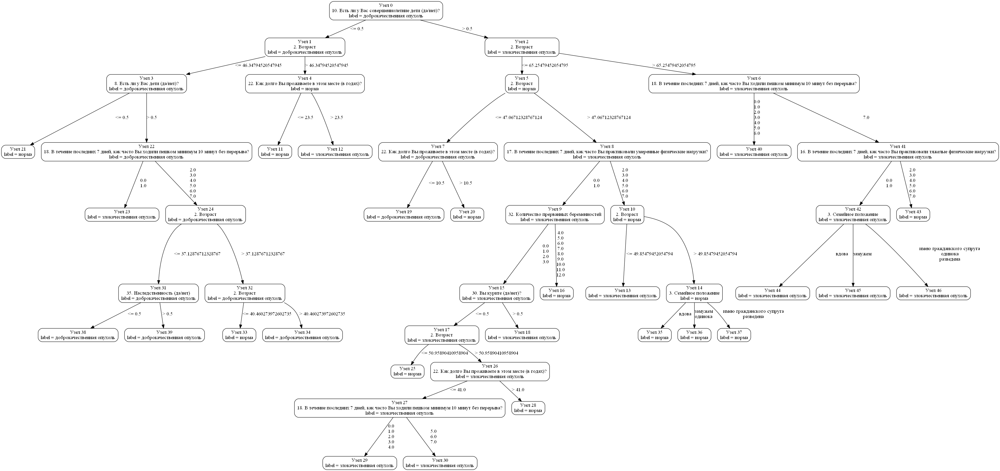

In [14]:
filename = os.path.join('..', 'reports', 'figures', 'MultiSplitDecisionTreeClassifier generalizing.gv')
generalizing_tree.render(
    rounded=True,
    # show_impurity=True,
    # show_num_samples=True,
    # show_distribution=True,
    show_label=True,
    filename=filename,
    format='png',
)
display.Image(f'{filename}.png')

## Feature importances

[Навигация](#Навигация)

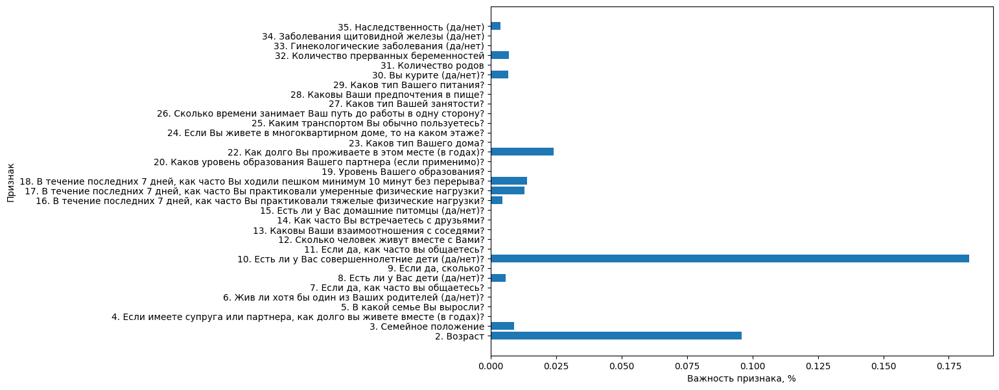

In [15]:
features = list(generalizing_tree.feature_importances.keys())
importances = generalizing_tree.feature_importances.values()

fig, ax = plt.subplots(figsize=(10, 7))
ax.barh(features, importances, align='center')
ax.set(xlabel='Важность признака, %', ylabel='Признак')

plt.show()